Question 1

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
img1 = cv2.imread('/content/bullet-space.jpg')
img2 = cv2.imread('/content/planets.png')

In [ ]:
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

In [ ]:
# arithmetic operations
add_img = cv2.add(img1, img2)
sub_img = cv2.subtract(img1, img2)
mul_img = cv2.multiply(img1, img2)
div_img = cv2.divide(img1, img2)

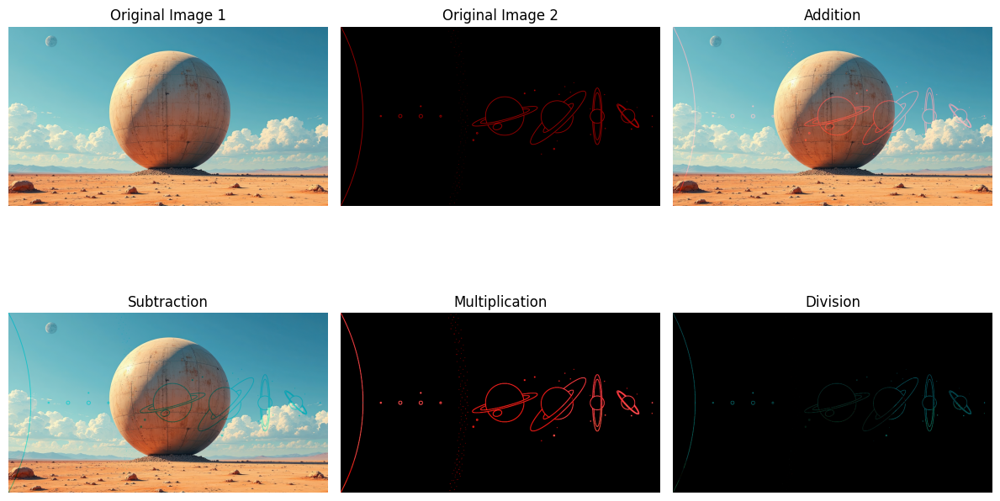

In [ ]:
#  results
titles = ['Original Image 1', 'Original Image 2', 'Addition', 'Subtraction', 'Multiplication', 'Division']
images = [img1, img2, add_img, sub_img, mul_img, div_img]

plt.figure(figsize=(12, 8))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

Question 2

In [ ]:
img = cv2.imread('/content/bullet-space.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [ ]:
# gaussian noise
noise = np.random.normal(loc=0, scale=15, size=img.shape).astype(np.uint8)
noisy_img = cv2.add(img, noise)

In [ ]:
kernel_sizes = [2, 8, 16, 32, 128]
filtered_images = []

In [ ]:
# mean blur
for k in kernel_sizes:
    blur = cv2.blur(noisy_img, (k, k))
    filtered_images.append((k, blur))

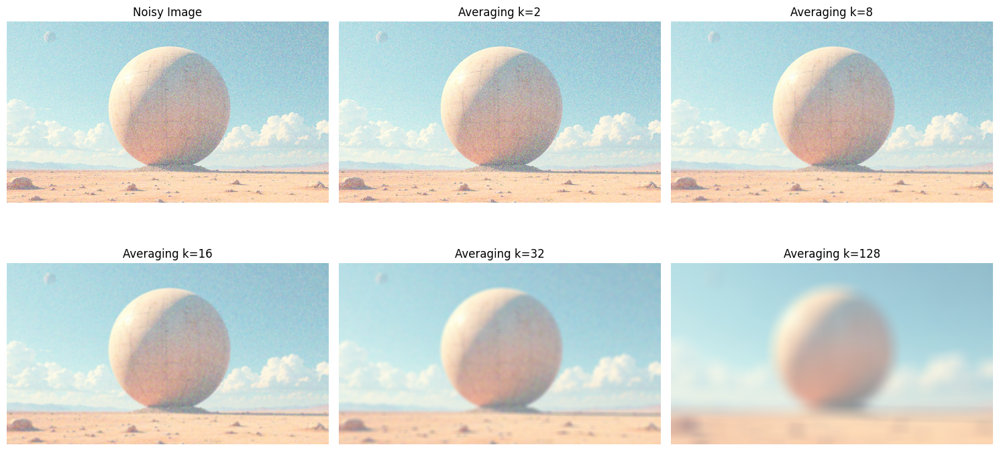

In [ ]:
# Plot
plt.figure(figsize=(15, 8))
plt.subplot(2, 3, 1)
plt.imshow(noisy_img)
plt.title("Noisy Image")
plt.axis('off')

for i, (k, fimg) in enumerate(filtered_images):
    plt.subplot(2, 3, i+2)
    plt.imshow(fimg)
    plt.title(f"Averaging k={k}")
    plt.axis('off')

plt.tight_layout()
plt.show()


k = 8 or k = 16 showed the best results

Question 3

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [ ]:
def averaging_filter(image, size=3):
    kernel = np.ones((size, size), np.float32) / (size * size)
    return cv2.filter2D(image, -1, kernel)

def gaussian_filter(image, size=5, sigma=1):
    return cv2.GaussianBlur(image, (size, size), sigma)

def laplacian_filter(image):
    return cv2.Laplacian(image, cv2.CV_64F)

def sobel_filter(image, direction='x'):
    if direction == 'x':
        return cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    else:
        return cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

def prewitt_filter(image, direction='x'):
    if direction == 'x':
        kernel = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
    else:
        kernel = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
    return cv2.filter2D(image, -1, kernel)

In [ ]:
image = cv2.imread("/content/default.jpg", cv2.IMREAD_GRAYSCALE)
print("Original Image:")
cv2_imshow(image)

# 1. Averaging
avg = averaging_filter(image, 5)
print("Averaging Filter (5x5):")
cv2_imshow(avg)

# 2. Gaussian
gauss = gaussian_filter(image, 5, 1)
print("Gaussian Filter (5x5):")
cv2_imshow(gauss)

# 3. Laplacian
lap = laplacian_filter(image)
print("Laplacian Filter:")
cv2_imshow(np.uint8(np.absolute(lap)))

# 4. Sobel X and Y
sobel_x = sobel_filter(image, 'x')
sobel_y = sobel_filter(image, 'y')
print("Sobel X Filter:")
cv2_imshow(np.uint8(np.absolute(sobel_x)))
print("Sobel Y Filter:")
cv2_imshow(np.uint8(np.absolute(sobel_y)))

# 5. Prewitt X and Y
prewitt_x = prewitt_filter(image, 'x')
prewitt_y = prewitt_filter(image, 'y')
print("Prewitt X Filter:")
cv2_imshow(prewitt_x)
print("Prewitt Y Filter:")
cv2_imshow(prewitt_y)


Question 4

In [ ]:
def averaging_kernel(size):
    return np.ones((size, size), np.float32) / (size * size)

def save_kernel(kernel, filename):
    np.savetxt(filename, kernel, fmt="%.5f")
    print(f"Saved {kernel.shape[0]}x{kernel.shape[1]} averaging kernel to {filename}")

def apply_filter(image, kernel_size):
    kernel = averaging_kernel(kernel_size)
    return cv2.filter2D(image, -1, kernel)

Original Image:


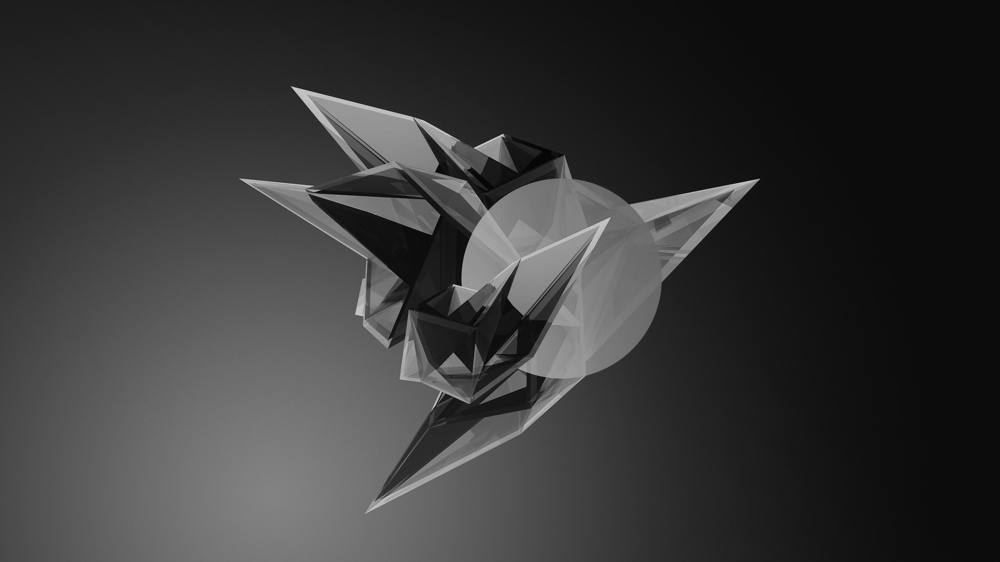

Saved 3x3 averaging kernel to kernel3.txt
Averaging Filter with 3x3 Kernel:


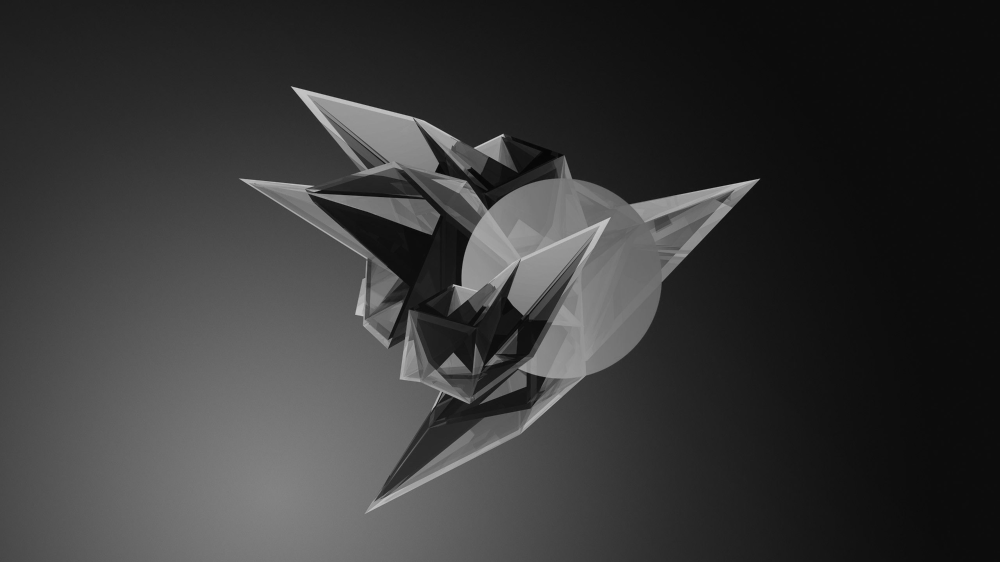

Saved 7x7 averaging kernel to kernel7.txt
Averaging Filter with 7x7 Kernel:


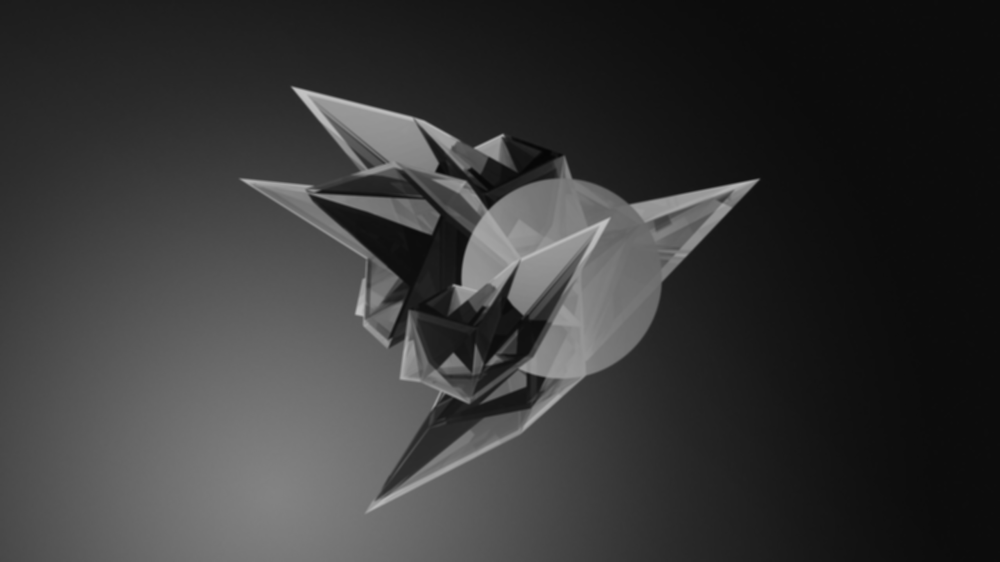

Saved 11x11 averaging kernel to kernel11.txt
Averaging Filter with 11x11 Kernel:


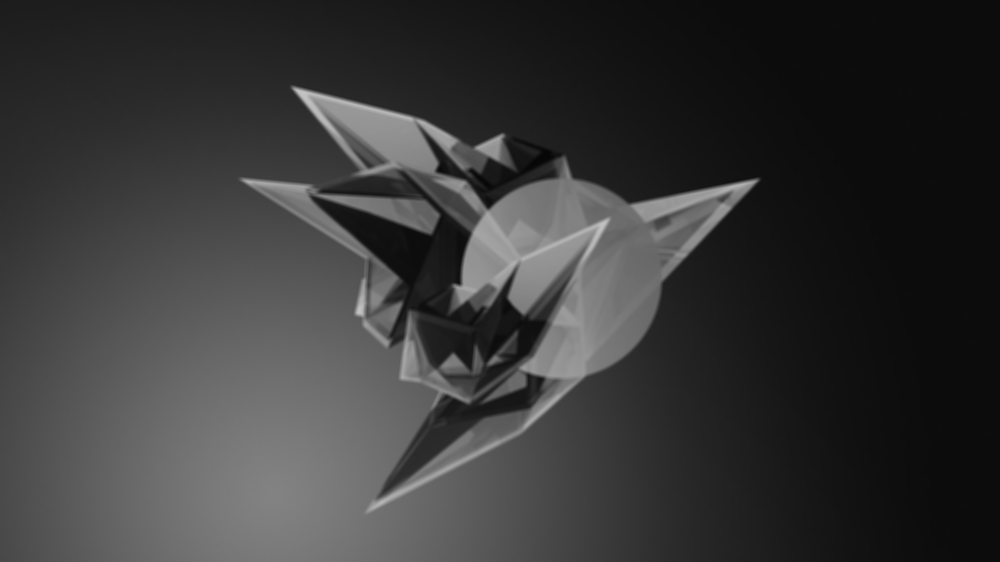

In [ ]:
image = cv2.imread("/content/default.jpg", cv2.IMREAD_GRAYSCALE)

print("Original Image:")
cv2_imshow(image)

kernel_sizes = [3, 7, 11]

for size in kernel_sizes:
    kernel = averaging_kernel(size)
    save_kernel(kernel, f"kernel{size}.txt")

    filtered_image = apply_filter(image, size)

    print(f"Averaging Filter with {size}x{size} Kernel:")
    cv2_imshow(filtered_image)

In [ ]:
with open("kernel3.txt", "r") as file:
    print(file.read())

0.11111 0.11111 0.11111
0.11111 0.11111 0.11111
0.11111 0.11111 0.11111



Question 5

In [ ]:
def add_salt_pepper_noise(image, prob=0.05):
    noisy = np.copy(image)
    black = 0
    white = 255
    probs = np.random.rand(*image.shape)

    noisy[probs < (prob / 2)] = black
    noisy[probs > 1 - (prob / 2)] = white
    return noisy

Original Image:


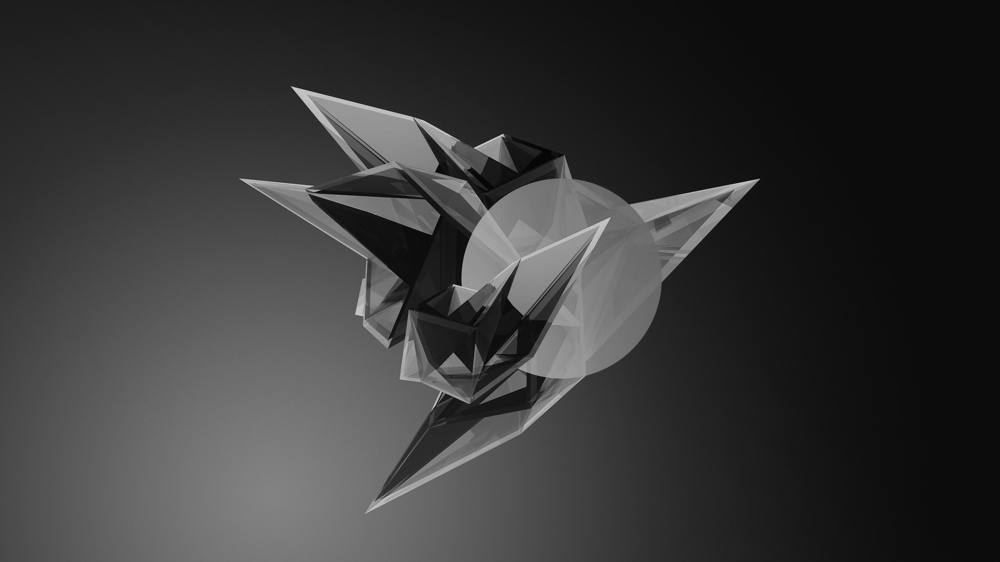

Image with Salt & Pepper Noise:


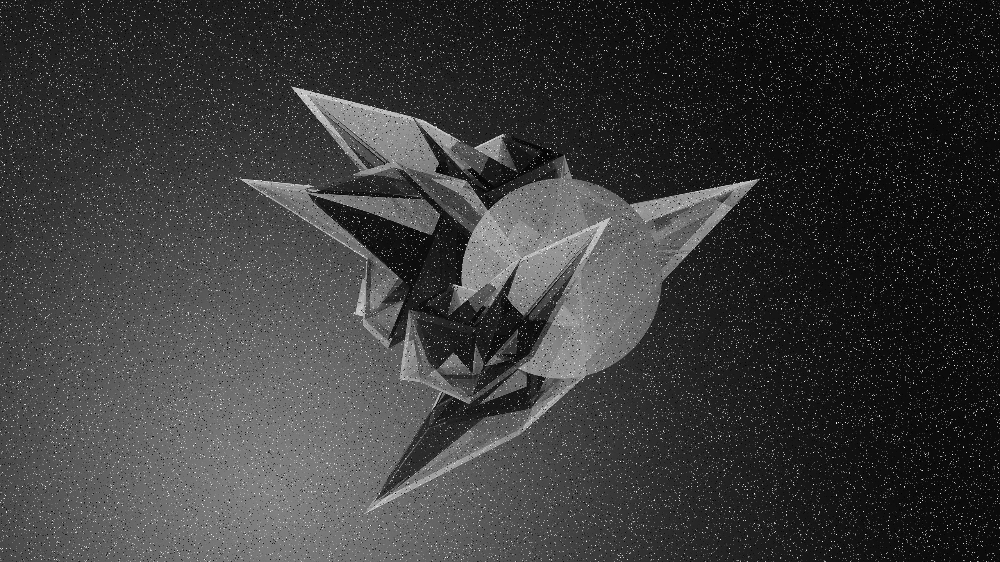

After Median Filtering:


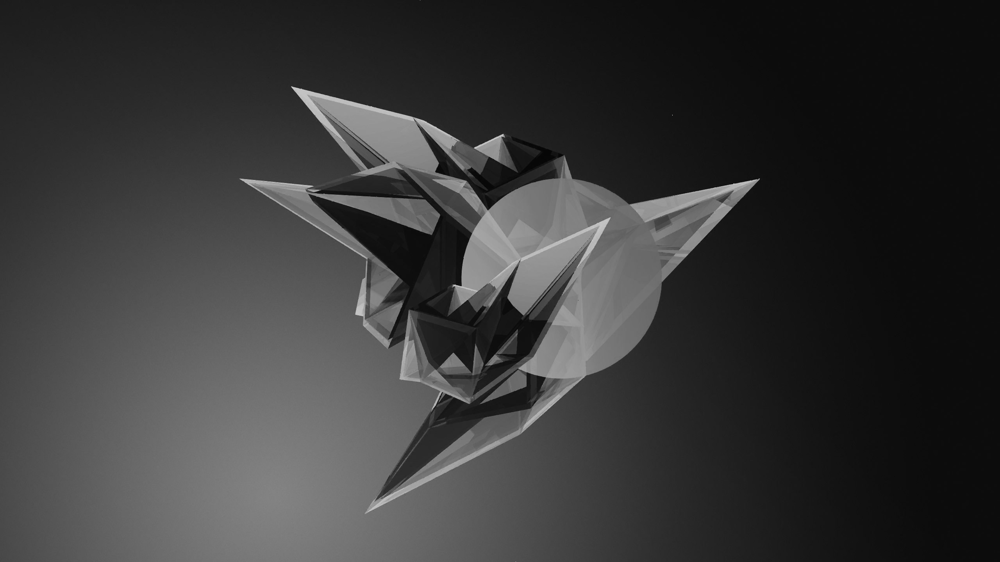

In [ ]:
image = cv2.imread("/content/default.jpg", cv2.IMREAD_GRAYSCALE)

print("Original Image:")
cv2_imshow(image)

noisy_img = add_salt_pepper_noise(image, prob=0.05)
print("Image with Salt & Pepper Noise:")
cv2_imshow(noisy_img)

median_filtered = cv2.medianBlur(noisy_img, 3)  # kernel size = 3x3
print("After Median Filtering:")
cv2_imshow(median_filtered)